# Imports

In [1]:
import mne
import numpy as np
import pandas as pd

from pyxdf import load_xdf

import matplotlib.pyplot as plt
import seaborn as sns

# Params

In [2]:
data_directory = '..\\Data\\XDF'

teams = {
    1:'SCASE',
    2:'Michel',
    3:'Py',
    4:'JahanP',
}

subject = 4
file_format = 'xdf'

micro_to_volt_ratio = 10**-6 #mne default unit is volt

In [3]:
ch_name_df = pd.read_csv('..\\Data\\biosemi_channels.csv')
biosemi_to_1020_names = dict(zip(ch_name_df['Alphabetical'], ch_name_df['1020']))

In [4]:
bands = {
    'theta': (4, 8), 
    'alpha': (8, 12),
    'lowbeta ': (12, 20), 
    'highbeta': (20, 30), 
    'gamma': (30, 40)
    }

In [5]:
backend = 'matplotlib'

# Loading

In [6]:
mne.viz.set_browser_backend(backend, verbose=None)

Using matplotlib as 2D backend.


## XDF

Data unit(s) : {'microvolts'}


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\2177029599.py:41: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(int(frequencies.min()), int(frequencies.max()))


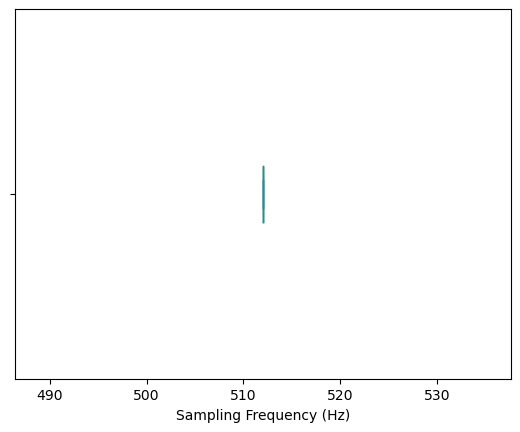

Creating RawArray with float64 data, n_channels=89, n_times=498212
    Range : 0 ... 498211 =      0.000 ...   973.011 secs
Ready.


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"25 misc, 64 EEG"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,0.00 Hz
Lowpass,256.02 Hz


In [7]:
# If xdf
fname = f'sub-P00{subject}_ses-S001_task-Default_run-001_eeg_{teams[subject]}'

if file_format == 'xdf':
    xdf, info = load_xdf(f'{data_directory}\\{fname}.xdf')
    
    # Extract eeg stream and markers for later
    all_markers = []
    for stream in xdf:
        if stream['info']['type'][0] == 'EEG':
            eeg_xdf = stream
        elif stream['info']['type'][0] == 'Markers':
            marker_df = pd.DataFrame(data={'time' : stream['time_stamps'], 'name' : np.array(stream['time_series']).T[0]})
            all_markers.append(marker_df)
            
    all_marker_df = pd.concat(all_markers).sort_values(by='time')
    
    # Extract eeg infos
    ## Timestamps and values
    eeg_values = np.array(eeg_xdf['time_series'])
    eeg_times = eeg_xdf['time_stamps']

    ## Metadata
    biosemi_to_mne_types = {
        'EEG':'eeg',
        'AUX':'misc',
        'EXG':'misc',
        'Trigger':'misc',
    }

    ch_names = [ch['label'][0] for ch in eeg_xdf['info']['desc'][0]['channels'][0]['channel']]
    ch_types = [biosemi_to_mne_types[ch['type'][0]] for ch in eeg_xdf['info']['desc'][0]['channels'][0]['channel']]
    units = set([ch['unit'][0] for ch in eeg_xdf['info']['desc'][0]['channels'][0]['channel']])
    print('Data unit(s) :', units)

    ## Focus on sampling frequency because of my PTSDs
    frequencies = pd.Series(1/np.diff(eeg_times))
    
    fig, ax = plt.subplots()
    frequencies.plot(kind="box", vert=False, ax=ax)
    ax.set_xlim(int(frequencies.min()), int(frequencies.max()))
    ax.set_xlabel('Sampling Frequency (Hz)')
    plt.show()

    sfreq = frequencies.mean()

    # Create MNE Raw object
    raw_info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = ch_types)
    raw_data = eeg_values.T #xdf is (n_samples, n_channels) while mne is (n_channels, n_samples)
    raw_data*= micro_to_volt_ratio
    raw = mne.io.RawArray(raw_data, raw_info)
    
    # Add markers as annotations
    annotations = mne.Annotations(
        onset = all_marker_df['time']-eeg_xdf['time_stamps'][0],  # in seconds, aligned with eeg time serie
        duration=[0]*len(all_marker_df),  # often 0 for us
        description=all_marker_df['name'],
        )
    raw.set_annotations(annotations)

    display(raw)

## Set

In [8]:
# If set
if file_format == 'set':
    raw = mne.io.read_raw_eeglab(f'{data_directory}\\sub-{subject}\\{subject}.set', preload=True)

    unknown_types = {
        'aux': ['AUX1', 'AUX10', 'AUX11', 'AUX12', 'AUX13', 'AUX14', 'AUX15', 'AUX16', 'AUX2', 'AUX3', 'AUX4', 'AUX5', 'AUX6', 'AUX7', 'AUX8', 'AUX9'],
        'exg': ['EX1', 'EX2', 'EX3', 'EX4', 'EX5', 'EX6', 'EX7', 'EX8'],
        'trigger': ['Trig1'],
    }

    unknown_ch = [ch for l in list(unknown_types.values()) for ch in l]
    new_types = ['misc' if ch in unknown_ch else 'eeg' for ch in raw.ch_names]

    raw.set_channel_types(dict(zip(raw.ch_names, new_types)))

    display(raw)

## Montage

In [9]:
# Montage
print(mne.channels.get_builtin_montages())
standard_1020 = mne.channels.make_standard_montage('standard_1020')

raw.pick('eeg') # Keep only channels of the montage
mne.rename_channels(raw.info, biosemi_to_1020_names)

raw.set_montage(standard_1020)

['standard_1005', 'standard_1020', 'standard_alphabetic', 'standard_postfixed', 'standard_prefixed', 'standard_primed', 'biosemi16', 'biosemi32', 'biosemi64', 'biosemi128', 'biosemi160', 'biosemi256', 'easycap-M1', 'easycap-M10', 'easycap-M43', 'EGI_256', 'GSN-HydroCel-32', 'GSN-HydroCel-64_1.0', 'GSN-HydroCel-65_1.0', 'GSN-HydroCel-128', 'GSN-HydroCel-129', 'GSN-HydroCel-256', 'GSN-HydroCel-257', 'mgh60', 'mgh70', 'artinis-octamon', 'artinis-brite23', 'brainproducts-RNP-BA-128']


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,0.00 Hz
Lowpass,256.02 Hz


## Plot

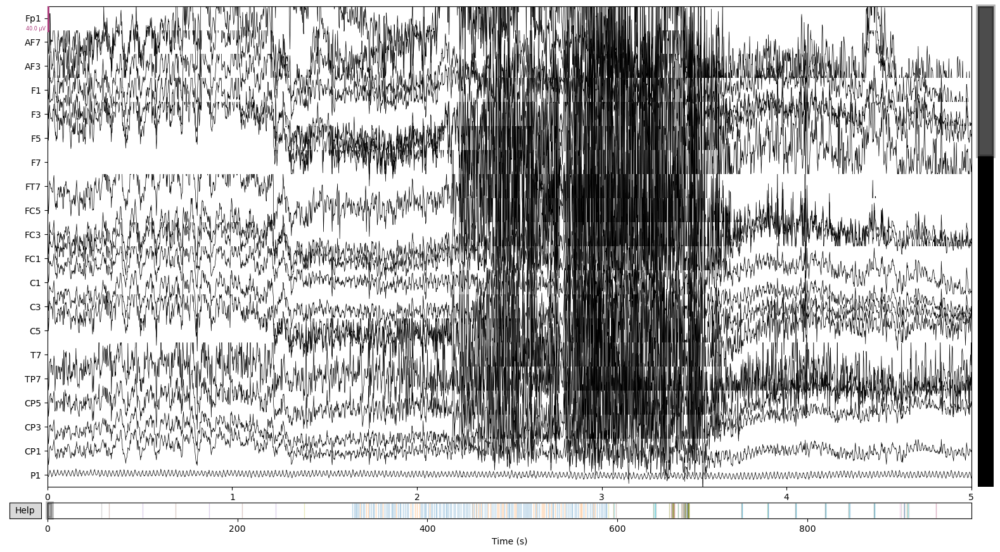

In [10]:
raw.plot(duration=5);

# Preprocessing

In [11]:
clean = raw.copy()
clean.set_eeg_reference('average')
clean.filter(1,40)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.7s finished


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,1.00 Hz
Lowpass,40.00 Hz


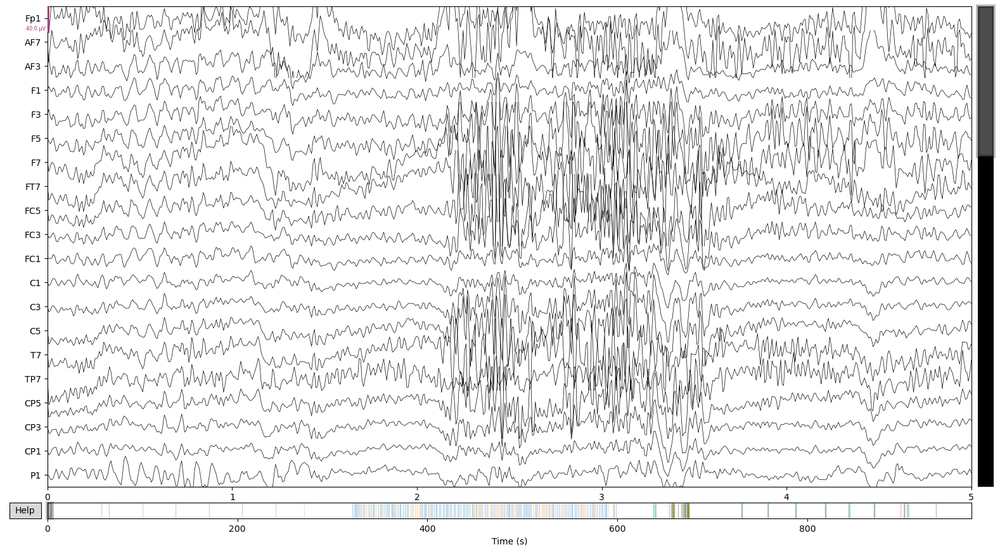

In [12]:
clean.plot(duration=5);

# Marker visualisation

In [13]:
events, original_event_dict = mne.events_from_annotations(clean)
r_original_event_dict = {value:key for key, value in original_event_dict.items()}

Used Annotations descriptions: ['3 pressed', '3 released', '7 pressed', '7 released', 'A pressed', 'A released', 'BACK pressed', 'BACK released', 'D pressed', 'D released', 'DOWN pressed', 'DOWN released', 'EC', 'EO', 'ESCAPE pressed', 'ESCAPE released', 'End', 'F pressed', 'F released', 'LEFT pressed', 'LEFT released', 'LMENU pressed', 'LMENU released', 'LWIN pressed', 'LWIN released', 'P pressed', 'P released', 'RETURN pressed', 'RETURN released', 'RIGHT pressed', 'RIGHT released', 'RSHIFT pressed', 'RSHIFT released', 'Start', 'TAB pressed', 'TAB released', 'normal', 'odd']


In [14]:
r_original_event_dict

{1: '3 pressed',
 2: '3 released',
 3: '7 pressed',
 4: '7 released',
 5: 'A pressed',
 6: 'A released',
 7: 'BACK pressed',
 8: 'BACK released',
 9: 'D pressed',
 10: 'D released',
 11: 'DOWN pressed',
 12: 'DOWN released',
 13: 'EC',
 14: 'EO',
 15: 'ESCAPE pressed',
 16: 'ESCAPE released',
 17: 'End',
 18: 'F pressed',
 19: 'F released',
 20: 'LEFT pressed',
 21: 'LEFT released',
 22: 'LMENU pressed',
 23: 'LMENU released',
 24: 'LWIN pressed',
 25: 'LWIN released',
 26: 'P pressed',
 27: 'P released',
 28: 'RETURN pressed',
 29: 'RETURN released',
 30: 'RIGHT pressed',
 31: 'RIGHT released',
 32: 'RSHIFT pressed',
 33: 'RSHIFT released',
 34: 'Start',
 35: 'TAB pressed',
 36: 'TAB released',
 37: 'normal',
 38: 'odd'}

In [15]:
event_df = pd.DataFrame(data=events, columns=['index', 'duration', 'id'])
event_df['name'] = event_df['id'].apply(lambda x : r_original_event_dict[x])
event_df['time'] = event_df['index']/int(raw.info['sfreq'])
event_df[-10:]

,index,duration,id,name,time
261,461765,0,9,D pressed,901.884766
262,461853,0,10,D released,902.056641
263,461929,0,25,LWIN released,902.205078
264,463231,0,24,LWIN pressed,904.748047
265,463440,0,26,P pressed,905.156250
266,463523,0,27,P released,905.318359
267,464023,0,27,P released,906.294922
268,464313,0,25,LWIN released,906.861328
269,478997,0,5,A pressed,935.541016
270,479055,0,6,A released,935.654297


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\2111091752.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=original_event_dict)


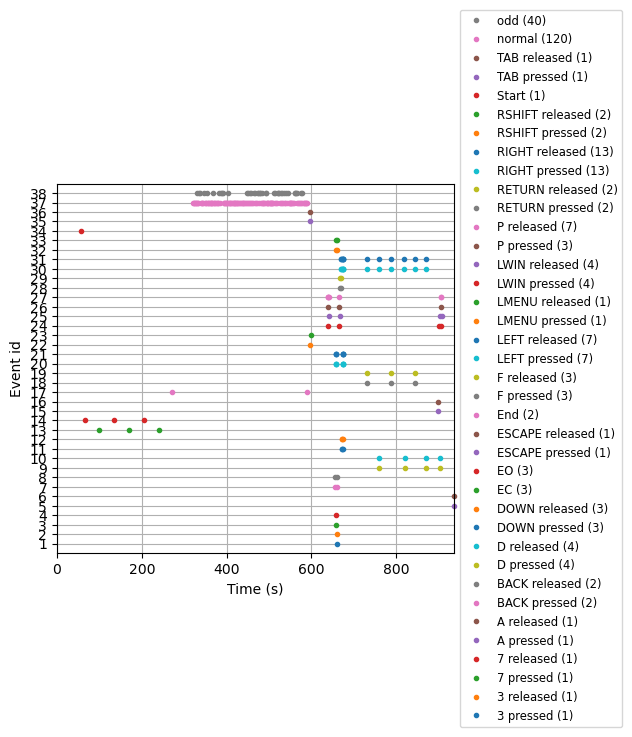

In [16]:
#All markers
fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=original_event_dict)
fig_events;

C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\3356605378.py:6: RuntimeWarning: event 1 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\3356605378.py:6: RuntimeWarning: event 2 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\3356605378.py:6: RuntimeWarning: event 3 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\3356605378.py:6: RuntimeWarning: event 4 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_2660\3356605378.py:6: RuntimeWarning:

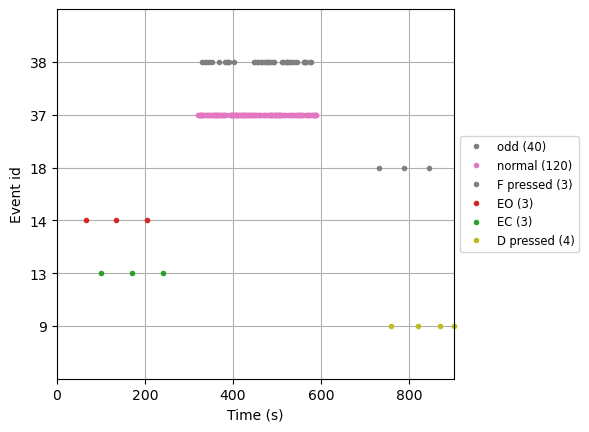

In [17]:
#Or maybe just a subset
selected_markers = ['EO', 'EC', 'normal', 'odd', 'F pressed', 'D pressed']
selected_event_dict = {key:value for key, value in original_event_dict.items() if key in selected_markers}


fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
fig_events;

# Visualization

In [18]:
triggers = ['Start']
current_event_dict = {key:value for key, value in original_event_dict.items() if key in triggers}

tmin = 120  # start of each epoch 
tmax = 150 # end of each epoch
baseline = None  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

viz_epochs = mne.Epochs(clean, events, current_event_dict, tmin, tmax, proj=True,
                    picks=picks, baseline=baseline,
                    reject=reject, preload=True)

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 15362 original time points ...
0 bad epochs dropped


In [19]:
print(subject, tmin, tmax)

4 120 150


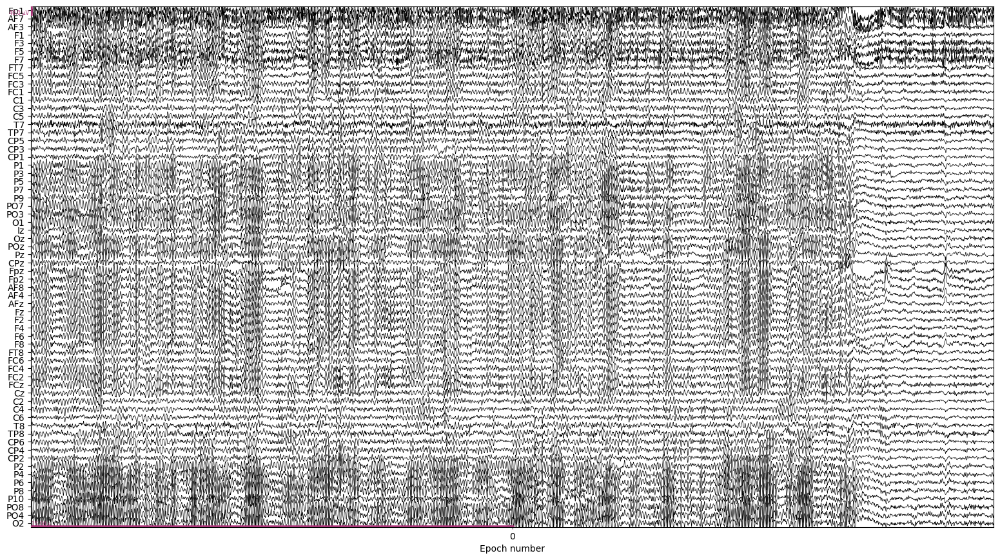

In [20]:
viz_epochs.plot(n_channels=64, show_scrollbars=False);

# Resting State

## Epoching

In [21]:
triggers = ['EC', 'EO']
current_event_dict = {key:value for key, value in original_event_dict.items() if key in triggers}

tmin = -0.5  # start of each epoch 
tmax = 25  # end of each epoch
baseline = None  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

rs_epochs = mne.Epochs(clean, events, current_event_dict, tmin, tmax, proj=True,
                    picks=picks, baseline=baseline,
                    reject=reject, preload=True)

Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 6 events and 13058 original time points ...
0 bad epochs dropped


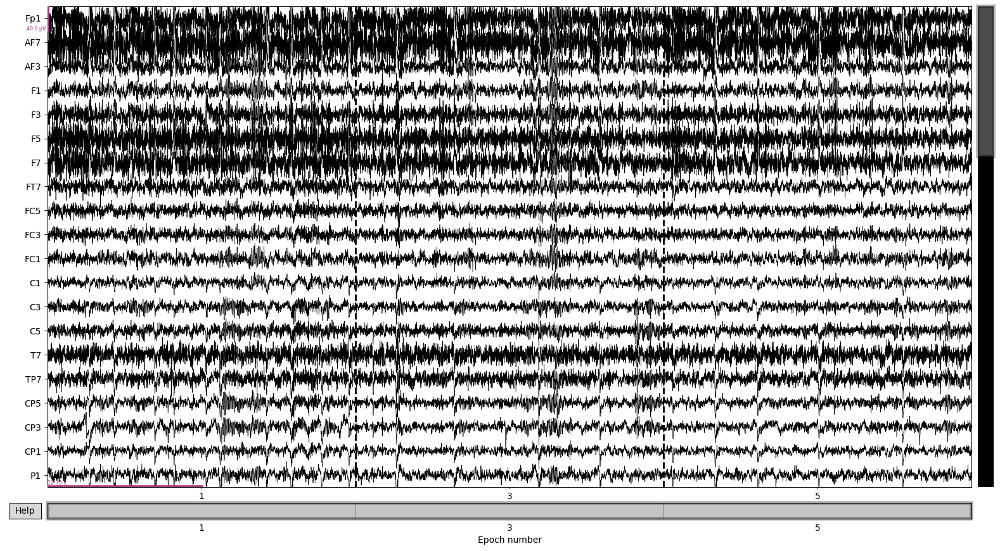

In [22]:
rs_epochs['EO'].plot();

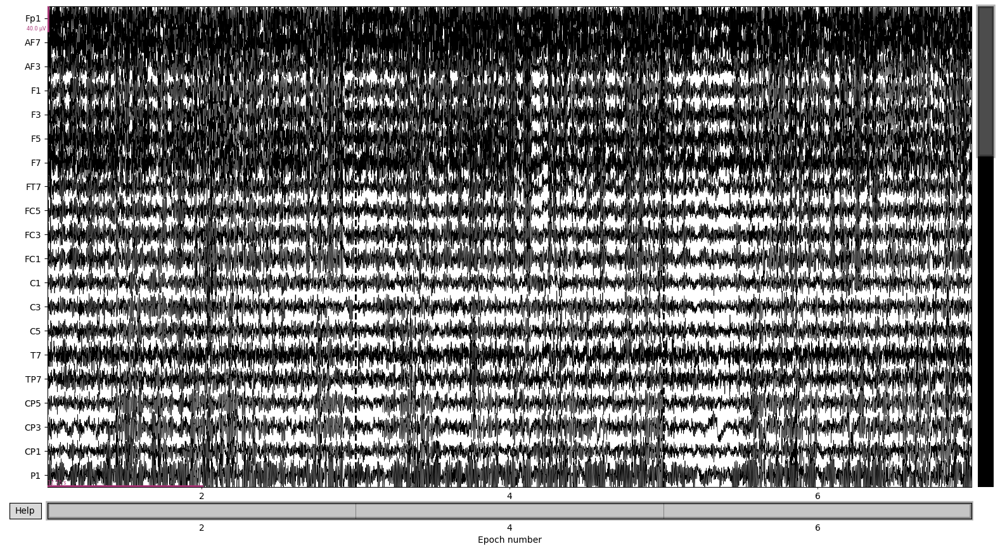

In [23]:
rs_epochs['EC'].plot();

## Frequency Bands Visualization

### General spectrum

    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs...
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs...


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17272\652032505.py:5: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  rs_psd.plot(dB=True, average=True, axes=ax)
C:\Python\Lib\site-packages\mne\viz\utils.py:167: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17272\652032505.py:5: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  rs_psd.plot(dB=True, average=True, axes=ax)


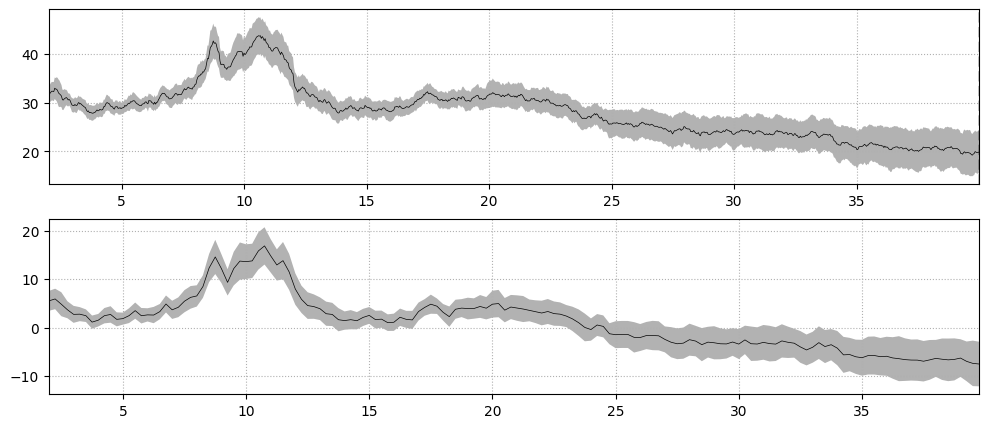

In [24]:
fig, axs = plt.subplots(2, figsize=(12,5))
for i, method in enumerate(['multitaper', 'welch']):
    ax = axs[i]
    rs_psd = rs_epochs['EC'].compute_psd(method=method, fmin=2.0, fmax=40.0)
    rs_psd.plot(dB=True, average=True, axes=ax)

plt.show()

### Topomap

Effective window size : 4.000 (s)
EO


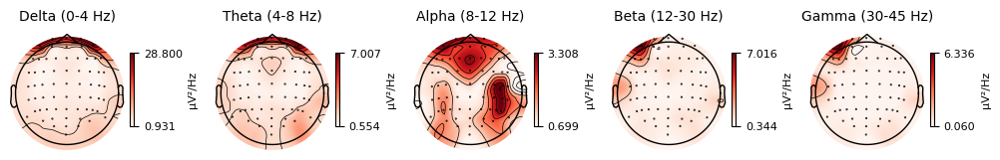

----------------
EC


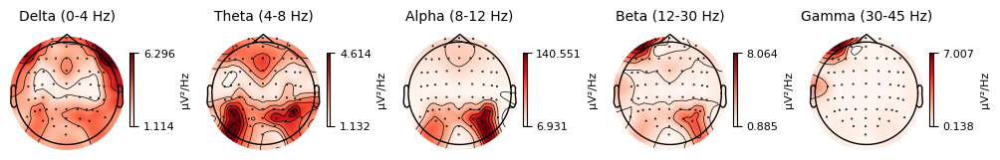

----------------


In [25]:
triggers = ['EO', 'EC']
rs_psd = rs_epochs.compute_psd(method=method, fmin=2.0, fmax=40.0)
for trigger in triggers :
    print(trigger)
    rs_psd[trigger].plot_topomap()
    plt.show()
    print('----------------')

### PO Alpha power

In [26]:
bands = {
    # 'theta': (4, 8), 
    'alpha': (8, 12),
    # 'lowbeta ': (12, 20), 
    # 'highbeta': (20, 30), 
    # 'gamma': (30, 40)
    }

def freq_to_band(freq, bands):
    for band_name, (fmin, fmax) in bands.items():
        if fmin <= freq <= fmax:
            return band_name
    return np.nan

rs_psd_df = rs_psd.to_data_frame(long_format=True).drop(columns=['ch_type'])
rs_psd_df['band'] = rs_psd_df['freq'].apply(freq_to_band, bands=bands)
rs_band_df = rs_psd_df.copy().dropna().drop(columns=['freq']).groupby(by=['condition', 'epoch', 'channel', 'band'], observed=True).mean().reset_index()

rs_band_df

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


,condition,epoch,channel,band,value
0,EC,2,AF3,alpha,3.691341e-11
1,EC,2,AF4,alpha,3.778346e-11
2,EC,2,AF7,alpha,3.234652e-11
3,EC,2,AF8,alpha,3.087152e-11
4,EC,2,AFz,alpha,3.949067e-11
...,...,...,...,...,...
379,EO,5,Pz,alpha,7.599921e-13
380,EO,5,T7,alpha,9.142927e-13
381,EO,5,T8,alpha,2.003161e-12
382,EO,5,TP7,alpha,9.800201e-13


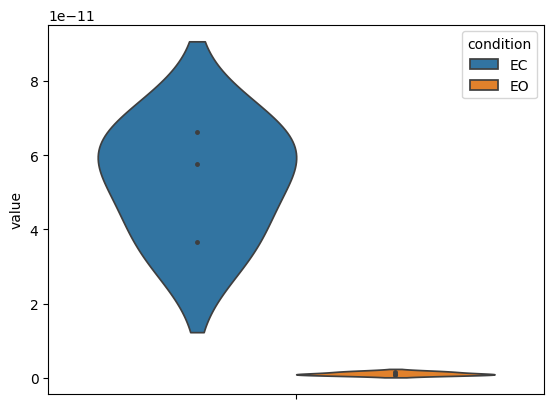

In [27]:
plot_df = rs_band_df[rs_band_df['channel']=='POz']
sns.violinplot(data=plot_df, hue='condition', y='value', inner="point")

plt.show()

# Auditory Oddball

## Epoching

In [21]:
triggers = ['normal', 'odd']
current_event_dict = {key:value for key, value in original_event_dict.items() if key in triggers}

tmin = -0.2  # start of each epoch 
tmax = 1  # end of each epoch
baseline = (-0.2, 0)  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

oddball_epochs = mne.Epochs(clean, events, current_event_dict, tmin, tmax, proj=True,
                    picks=picks, baseline=baseline,
                    reject=reject, preload=True)

Not setting metadata
160 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 160 events and 615 original time points ...
0 bad epochs dropped


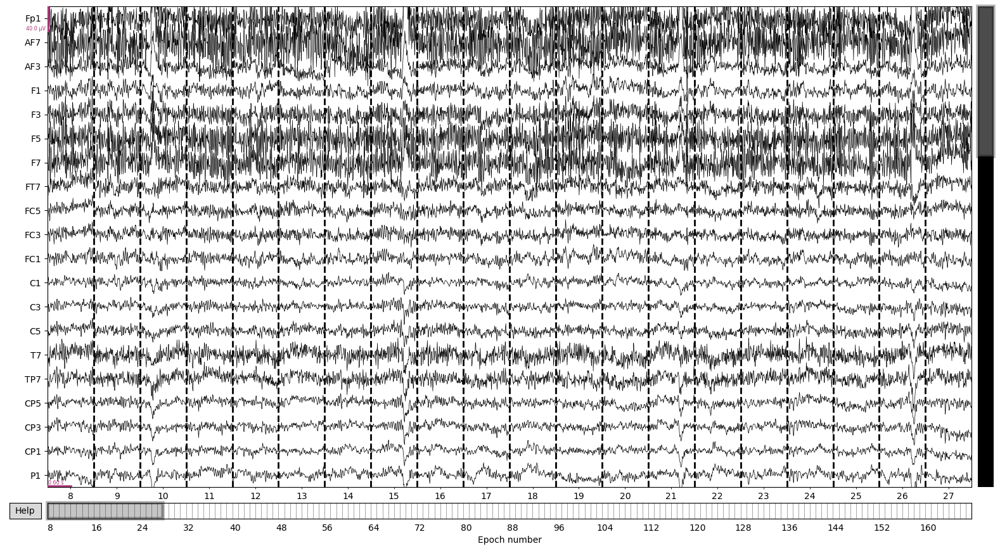

In [22]:
oddball_epochs.plot();

## ERPs Visualization

In [23]:
triggers = ['normal', 'odd']
evoked_dict = {condition:list(oddball_epochs[condition].iter_evoked()) for condition in triggers}

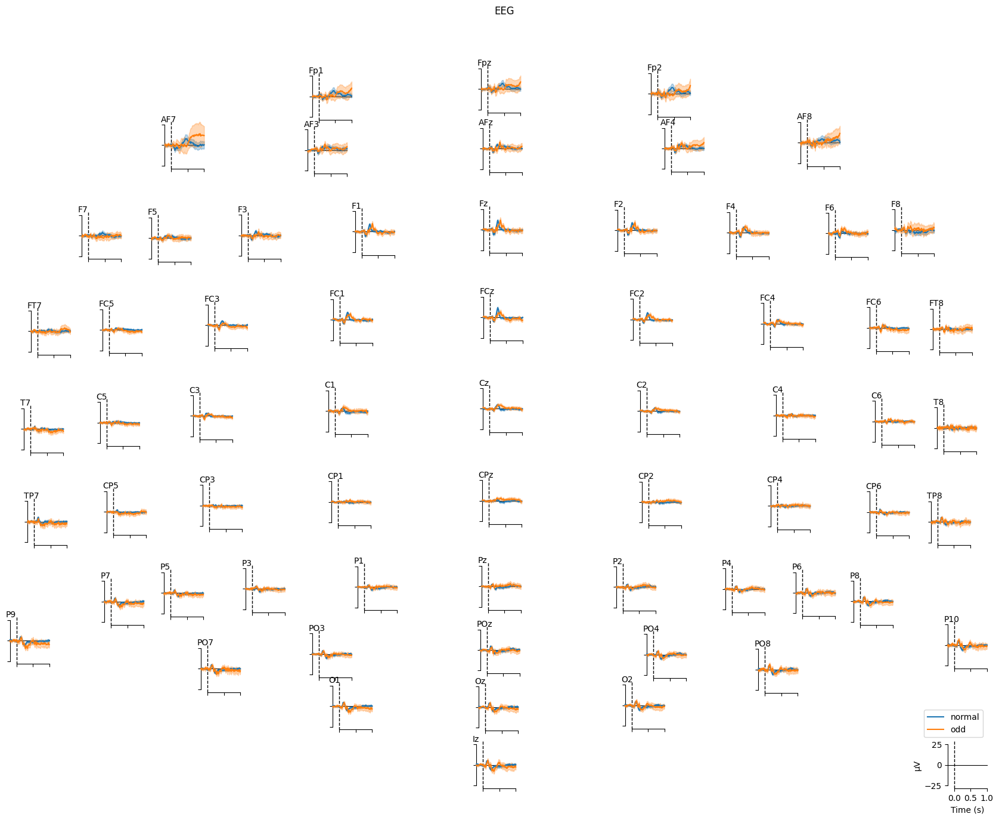

In [31]:
mne.viz.plot_compare_evokeds(
    evoked_dict,
    picks="eeg",
    colors={condition:i for i, condition in enumerate(triggers)},
    # linestyles=dict(left="solid", right="dashed"),
    axes="topo",
    # styles=dict(aud=dict(linewidth=1), vis=dict(linewidth=1)),
);

combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_15956\245208565.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_15956\245208565.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_15956\245208565.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_15956\245208565.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


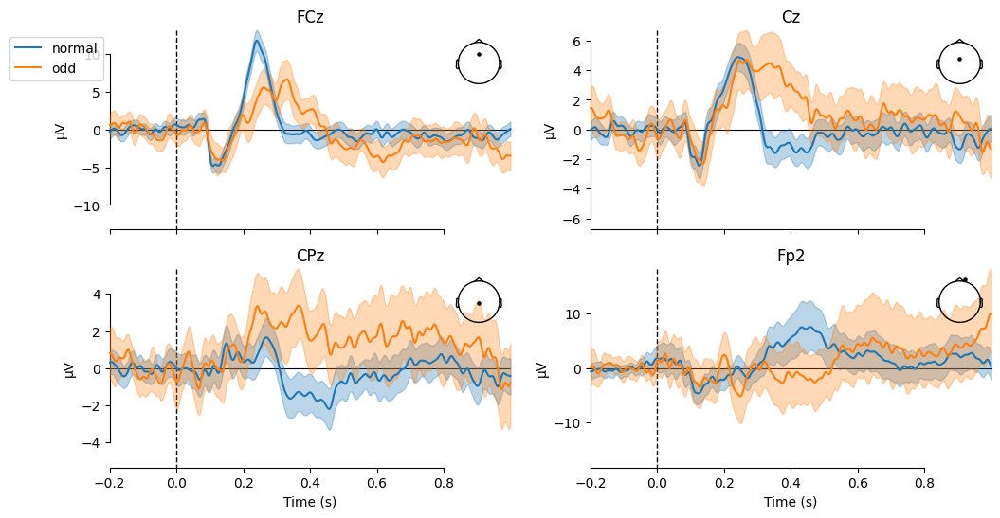

In [32]:
picks = ['FCz', 'Cz', 'CPz', 'Fp2']
ratio = 2
fig, axs = plt.subplots(ratio,int(len(picks)/ratio), figsize = (12,6), sharex=True)

for i, ch in enumerate(picks):
    ax = axs[int(i/len(axs[0])), i%len(axs[0])]
    mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)
    
    if i == 0:
        ax.legend(bbox_to_anchor=(0,1))
    else:
        ax.get_legend().remove()
        
    if int(i/len(axs[0])) != len(axs[0])-1:
        ax.set_xlabel(None)
    
    
plt.show()

# Calculation Task

## Epoching

In [33]:
triggers = ['F pressed', 'D pressed']
rename_triggers = {'F pressed':'easy', 'D pressed':'hard'}
current_event_dict = {rename_triggers[key]:value for key, value in original_event_dict.items() if key in triggers}

tmin = -0.5  # start of each epoch 
tmax = 5  # end of each epoch
baseline = None  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

calculation_epochs = mne.Epochs(clean, events, current_event_dict, tmin, tmax, proj=True,
                    picks=picks, baseline=baseline,
                    reject=reject, preload=True)

Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 7 events and 2817 original time points ...
0 bad epochs dropped


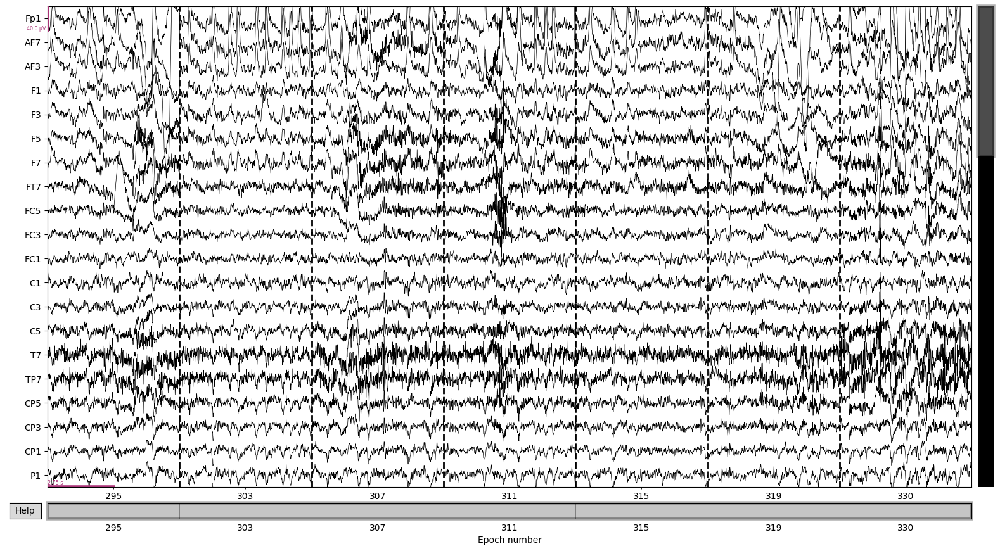

In [34]:
calculation_epochs.plot();

## Frequency Bands Visualization

Effective window size : 4.000 (s)
easy


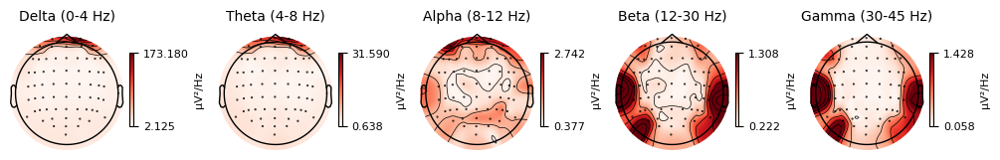

----------------
hard


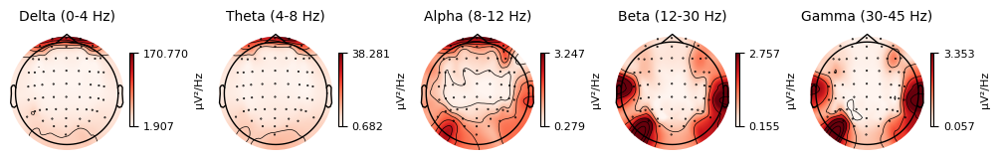

----------------


In [35]:
triggers = ['easy', 'hard']
calculation_psd = calculation_epochs.compute_psd(method=method, fmin=2.0, fmax=40.0)
for trigger in triggers :
    print(trigger)
    calculation_psd[trigger].plot_topomap()
    plt.show()
    print('----------------')

In [36]:
bands = {
    'theta': (4, 8), 
    'alpha': (8, 12),
    'lowbeta ': (12, 20), 
    # 'highbeta': (20, 30), 
    # 'gamma': (30, 40)
    }

def freq_to_band(freq, bands):
    for band_name, (fmin, fmax) in bands.items():
        if fmin <= freq <= fmax:
            return band_name
    return np.nan

calculation_psd_df = calculation_psd.to_data_frame(long_format=True).drop(columns=['ch_type'])
calculation_psd_df['band'] = calculation_psd_df['freq'].apply(freq_to_band, bands=bands)
calculation_band_df = calculation_psd_df.copy().dropna().drop(columns=['freq']).groupby(by=['condition', 'epoch', 'channel', 'band'], observed=True).mean().reset_index()

calculation_band_df

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


,condition,epoch,channel,band,value
0,easy,295,AF3,alpha,1.286078e-12
1,easy,295,AF3,lowbeta,5.748730e-13
2,easy,295,AF3,theta,4.654547e-12
3,easy,295,AF4,alpha,9.070293e-13
4,easy,295,AF4,lowbeta,5.566445e-13
...,...,...,...,...,...
1339,hard,330,TP7,lowbeta,1.808870e-12
1340,hard,330,TP7,theta,6.357958e-12
1341,hard,330,TP8,alpha,2.405344e-12
1342,hard,330,TP8,lowbeta,1.551474e-12


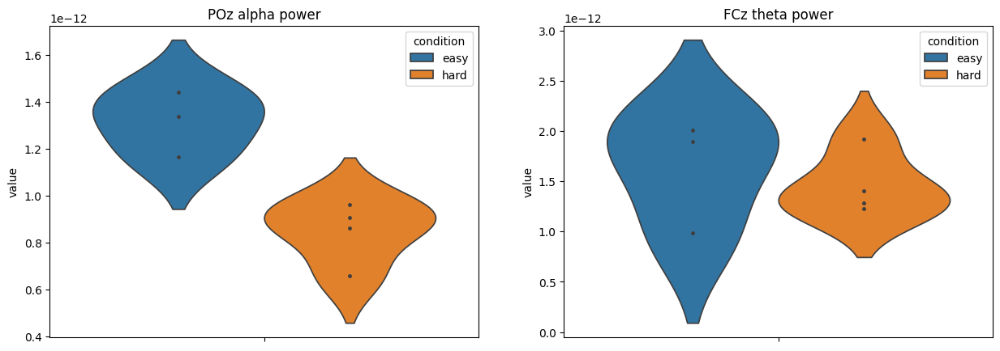

In [38]:
conditions = {
    'POz alpha power':{"channel": "POz","band": "alpha"},
    'FCz theta power':{"channel": "FCz","band": "theta"},
}

fig, axs = plt.subplots(1,2, figsize=(15,5))

for i, (label, params) in enumerate(conditions.items()):
    ax = axs[i]
    plot_df = calculation_band_df.copy()
    for column, value in params.items():
        plot_df = plot_df[plot_df[column] == value]

    # display(plot_df)
    sns.violinplot(data=plot_df, hue='condition', y='value', inner="point", ax=ax)
    ax.set_title(label)

plt.show()

# Speed Caping Results (todo)

In [39]:
oddball_mean_df = oddball_epochs.to_data_frame().groupby(by=['condition', 'time']).mean().drop(columns=['epoch']).reset_index().melt(id_vars=['condition', 'time'], var_name='channel')
oddball_mean_df = oddball_mean_df.pivot(columns='condition', index=['time', 'channel'], values='value').reset_index()
oddball_mean_df.columns = oddball_mean_df.columns.to_list()

oddball_mean_df['contrast'] = oddball_mean_df['odd'] - oddball_mean_df['normal']
oddball_mean_df

,time,channel,normal,odd,contrast
0,-0.199207,AF3,-0.203264,-1.264608,-1.061344
1,-0.199207,AF4,-0.561056,0.079520,0.640577
2,-0.199207,AF7,-0.018102,0.118640,0.136742
3,-0.199207,AF8,-0.326931,-0.094387,0.232544
4,-0.199207,AFz,-0.181532,0.217762,0.399294
...,...,...,...,...,...
39355,0.999941,Pz,0.176174,-0.546189,-0.722362
39356,0.999941,T7,0.014758,-2.866892,-2.881650
39357,0.999941,T8,-0.077646,0.092511,0.170157
39358,0.999941,TP7,0.218804,-2.693503,-2.912307


In [40]:
calculation_band_df

,condition,epoch,channel,band,value
0,easy,295,AF3,alpha,1.286078e-12
1,easy,295,AF3,lowbeta,5.748730e-13
2,easy,295,AF3,theta,4.654547e-12
3,easy,295,AF4,alpha,9.070293e-13
4,easy,295,AF4,lowbeta,5.566445e-13
...,...,...,...,...,...
1339,hard,330,TP7,lowbeta,1.808870e-12
1340,hard,330,TP7,theta,6.357958e-12
1341,hard,330,TP8,alpha,2.405344e-12
1342,hard,330,TP8,lowbeta,1.551474e-12
